In [11]:
import re
import pandas as pd
import numpy as np

from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer
from sentence_transformers import SentenceTransformer
from bertopic import BERTopic
from umap import UMAP
from bertopic.representation import MaximalMarginalRelevance

import pathlib

import gensim.corpora as corpora
from gensim.models.coherencemodel import CoherenceModel

import plotly

In [12]:
# Prepare data
data_set_path = pathlib.Path("dataset/fsas/fsas_full_utf8_dated.csv")
trump = pd.read_csv(str(data_set_path))
trump.abstract = trump.apply(lambda row: re.sub(r"http\S+", "", row.abstract).lower(), 1)
trump.abstract = trump.apply(lambda row: " ".join(filter(lambda x: x[0] != "@", row.abstract.split())), 1)
trump.abstract = trump.apply(lambda row: " ".join(re.sub("[^a-zA-Z]+", " ", row.abstract).split()), 1)
# trump = trump.loc[(trump.isRetweet == "f") & (trump.abstract != ""), :]
timestamps = trump.date.to_list()
abstracts = trump.abstract.to_list()

data = abstracts

arr_multi = np.array(abstracts)
print(arr_multi)

['a concept of multi valued cognitive maps is introduced in this paper the concept expands the fuzzy one however all variables and weights are not linearly ordered in the concept but are only partially ordered such an approach allows us to operate in cognitive maps with partially ordered linguistic variables directly without vague fuzzification defuzzification methods hence we may consider more subtle differences in degrees of experts uncertainty than in the fuzzy case we prove the convergence of such cognitive maps and give two simple computational examples which demonstrate using such a partially ordered uncertainty degree scale compared to the fuzzy case'
 'in this paper we investigate the fixed time synchronization for fuzzy inertial neural networks with time varying coefficients and time delays the fuzzy inertial neural networks are transformed into two forms of first order differential systems and then two kinds of different controllers of time variable are designed in these sche

In [44]:
from bertopic.representation import KeyBERTInspired
from bertopic.vectorizers import ClassTfidfTransformer
from hdbscan import HDBSCAN

# Step 1 - Extract embeddings
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

# Step 2 - Reduce dimensionality
umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=0)

# Step 3 - Cluster reduced embeddings
hdbscan_model = HDBSCAN(min_cluster_size=15, metric='euclidean', cluster_selection_method='eom', prediction_data=True,
                        min_samples=5)

# Step 4 - Tokenize topics
vectorizer_model = CountVectorizer(stop_words="english")

# Step 5 - Create topic representation
ctfidf_model = ClassTfidfTransformer()

# Step 6 - (Optional) Fine-tune topic representations with
# a `bertopic.representation` model
representation_model = KeyBERTInspired()

topic_model = BERTopic(verbose=True,
                       calculate_probabilities=True,
                       nr_topics="auto",
                       embedding_model=embedding_model,  # Step 1 - Extract embeddings
                       umap_model=umap_model,  # Step 2 - Reduce dimensionality
                       hdbscan_model=hdbscan_model,  # Step 3 - Cluster reduced embeddings
                       vectorizer_model=vectorizer_model,  # Step 4 - Tokenize topics
                       ctfidf_model=ctfidf_model,  # Step 5 - Extract topic words
                       representation_model=representation_model,  # Step 6 - (Optional) Fine-tune topic represenations
                       min_topic_size=7  # Create more topics
                       )

topics, probs = topic_model.fit_transform(data)

topic_model.get_topic_info()

doc_img = topic_model.visualize_documents(abstracts, hide_annotations=True, width=910,
                                          height=585)
doc_img.show()


Batches:   0%|          | 0/269 [00:00<?, ?it/s]

2023-10-16 16:35:28,036 - BERTopic - Transformed documents to Embeddings
2023-10-16 16:35:38,315 - BERTopic - Reduced dimensionality
2023-10-16 16:35:41,594 - BERTopic - Clustered reduced embeddings
2023-10-16 16:36:05,297 - BERTopic - Reduced number of topics from 132 to 58


In [23]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,2125,-1_fuzzy_nonlinear_operators_systems,"[fuzzy, nonlinear, operators, systems, logic, ...",[this paper deals with the design of stable ru...
1,0,3000,0_fuzzy_measures_measure_properties,"[fuzzy, measures, measure, properties, sets, g...",[in this paper we introduce and investigate we...
2,1,1075,1_adaptive_fuzzy_lyapunov_nonlinear,"[adaptive, fuzzy, lyapunov, nonlinear, control...",[this paper is concerned with the problem of a...
3,2,263,2_multiobjective_fuzzy_optimization_constraint,"[multiobjective, fuzzy, optimization, constrai...",[two major approaches to deal with randomness ...
4,3,159,3_clustering_cluster_clusters_fuzzy,"[clustering, cluster, clusters, fuzzy, classif...",[clustering is one of the most popular data mi...
5,4,138,4_algebras_commutative_algebra_monadic,"[algebras, commutative, algebra, monadic, latt...",[state operators on convex effect algebras in ...
6,5,126,5_queries_querying_retrieval_databases,"[queries, querying, retrieval, databases, quer...",[uncertainty extensively exists in data and kn...
7,6,120,6_copulas_copula_aggregation_constructions,"[copulas, copula, aggregation, constructions, ...",[a new method of constructing lipschitz aggreg...
8,7,83,7_fuzzy_rough_sets_granular,"[fuzzy, rough, sets, granular, approximations,...",[in rough set theory the lower and upper appro...
9,8,79,8_fuzzy_recognition_images_pixels,"[fuzzy, recognition, images, pixels, filter, f...",[a multilayer feedforward fuzzy neural network...


In [24]:
# Preprocess documents
cleaned_docs = topic_model._preprocess_text(abstracts)

# Extract vectorizer and analyzer from BERTopic
vectorizer = topic_model.vectorizer_model
analyzer = vectorizer.build_analyzer()

# Extract features for Topic Coherence evaluation
words = vectorizer.get_feature_names_out()
tokens = [analyzer(doc) for doc in cleaned_docs]
dictionary = corpora.Dictionary(tokens)
corpus = [dictionary.doc2bow(token) for token in tokens]
topic_words = [[words for words, _ in topic_model.get_topic(topic)]
               for topic in range(len(set(topics)) - 1)]

# Evaluate c_v
coherence_model = CoherenceModel(topics=topic_words,
                                 texts=tokens,
                                 corpus=corpus,
                                 dictionary=dictionary,
                                 coherence='c_v')
coherence = coherence_model.get_coherence()
print("Unprocessed outliers coherence-\"c_v\" is " + str(coherence))

# Evaluate
coherence_model = CoherenceModel(topics=topic_words,
                                 texts=tokens,
                                 corpus=corpus,
                                 dictionary=dictionary,
                                 coherence='u_mass')
coherence = coherence_model.get_coherence()
print("Unprocessed outliers coherence-\"u_mass\" is " + str(coherence))


Unprocessed outliers coherence-"c_v" is 0.5144772677447916
Unprocessed outliers coherence-"u_mass" is -5.391007041245415


In [53]:
#こっから外れ値削減###########################################

# Use the "c-TF-IDF" strategy with a threshold
# new_topics = topic_model.reduce_outliers(abstracts, topics, strategy="c-tf-idf", threshold=0.1)

# Reduce all outliers that are left with the "distributions" strategy
# new_topics = topic_model.reduce_outliers(abstracts, new_topics, strategy="distributions")

threshold = 0.2

topic_model_ = topic_model

new_topics = topic_model_.reduce_outliers(abstracts, topics, probabilities=probs, strategy="probabilities",
                                          threshold=threshold)

#############################################################


topic_model_.update_topics(abstracts, topics=new_topics, vectorizer_model=vectorizer_model,
                           # Step 4 - Tokenize topics
                           ctfidf_model=ctfidf_model,
                           # Step 5 - Extract topic words
                           representation_model=representation_model,
                           # Step 6 - (Optional) Fine-tune topic represenations
                           )

############コヒーレンス計算

# Preprocess documents
cleaned_docs = topic_model_._preprocess_text(abstracts)

# Extract vectorizer and analyzer from BERTopic
vectorizer = topic_model_.vectorizer_model
analyzer = vectorizer.build_analyzer()

# Extract features for Topic Coherence evaluation
words = vectorizer.get_feature_names_out()
tokens = [analyzer(doc) for doc in cleaned_docs]
dictionary = corpora.Dictionary(tokens)
corpus = [dictionary.doc2bow(token) for token in tokens]
topic_words = [[words for words, _ in topic_model_.get_topic(topic)]
               for topic in range(len(set(topics)) - 1)]

# Evaluate c_v
coherence_model = CoherenceModel(topics=topic_words,
                                 texts=tokens,
                                 corpus=corpus,
                                 dictionary=dictionary,
                                 coherence='c_v')
coherence = coherence_model.get_coherence()
print("strategy=\"probabilities\" threshold = " + str(threshold) + " coherence-\"c_v\" is " + str(coherence))

# Evaluate
coherence_model = CoherenceModel(topics=topic_words,
                                 texts=tokens,
                                 corpus=corpus,
                                 dictionary=dictionary,
                                 coherence='u_mass')
coherence = coherence_model.get_coherence()
print("strategy=\"probabilities\" threshold = " + str(threshold) + " coherence-\"u_mass\" is " + str(coherence))


strategy="probabilities" threshold = 0.2 coherence-"c_v" is 0.5185984674772385
strategy="probabilities" threshold = 0.2 coherence-"u_mass" is -5.3504051950452745


In [54]:
#外れ値の数を表示
info_df = topic_model_.get_topic_info()
if (info_df["Topic"][0] == -1):
    print(info_df["Count"][0])
else:
    print(0)

1024


In [83]:
coh_result = np.zeros((11, 4))
ii = 1.0
for i in range(11):

    threshold = ii
    print("th: " + str(threshold))
    coh_result[i][0] = threshold

    topic_model_ = topic_model

    new_topics = topic_model_.reduce_outliers(abstracts, topics, probabilities=probs, strategy="probabilities",
                                              threshold=threshold)

    #############################################################

    topic_model_.update_topics(abstracts, topics=new_topics, vectorizer_model=vectorizer_model,
                               # Step 4 - Tokenize topics
                               ctfidf_model=ctfidf_model,
                               # Step 5 - Extract topic words
                               representation_model=representation_model,
                               # Step 6 - (Optional) Fine-tune topic represenations
                               )

    ############コヒーレンス計算

    # Preprocess documents
    cleaned_docs = topic_model_._preprocess_text(abstracts)

    # Extract vectorizer and analyzer from BERTopic
    vectorizer = topic_model_.vectorizer_model
    analyzer = vectorizer.build_analyzer()

    # Extract features for Topic Coherence evaluation
    words = vectorizer.get_feature_names_out()
    tokens = [analyzer(doc) for doc in cleaned_docs]
    dictionary = corpora.Dictionary(tokens)
    corpus = [dictionary.doc2bow(token) for token in tokens]
    topic_words = [[words for words, _ in topic_model_.get_topic(topic)]
                   for topic in range(len(set(topics)) - 1)]

    # Evaluate c_v
    coherence_model = CoherenceModel(topics=topic_words,
                                     texts=tokens,
                                     corpus=corpus,
                                     dictionary=dictionary,
                                     coherence='c_v')
    coherence = coherence_model.get_coherence()

    coh_result[i][1] = coherence

    print("strategy=\"probabilities\" threshold = " + str(threshold) + " coherence-\"c_v\" is " + str(coherence))

    # Evaluate
    coherence_model = CoherenceModel(topics=topic_words,
                                     texts=tokens,
                                     corpus=corpus,
                                     dictionary=dictionary,
                                     coherence='u_mass')
    coherence = coherence_model.get_coherence()
    print("strategy=\"probabilities\" threshold = " + str(threshold) + " coherence-\"u_mass\" is " + str(coherence))

    coh_result[i][2] = coherence

    info_df = topic_model_.get_topic_info()
    if (info_df["Topic"][0] == -1):
        coh_result[i][3] = info_df["Count"][0]
        print(info_df["Count"][0])
    else:
        coh_result[i][3] = 0
        print(0)

    ii -= 0.1

print(coh_result)


th: 1.0
strategy="probabilities" threshold = 1.0 coherence-"c_v" is 0.5144772677447916
strategy="probabilities" threshold = 1.0 coherence-"u_mass" is -5.391007041245415
2125
th: 0.9
strategy="probabilities" threshold = 0.9 coherence-"c_v" is 0.5144772677447916
strategy="probabilities" threshold = 0.9 coherence-"u_mass" is -5.391007041245415
2125
th: 0.8
strategy="probabilities" threshold = 0.8 coherence-"c_v" is 0.5144772677447916
strategy="probabilities" threshold = 0.8 coherence-"u_mass" is -5.391007041245415
2125
th: 0.7000000000000001
strategy="probabilities" threshold = 0.7000000000000001 coherence-"c_v" is 0.5154212305324873
strategy="probabilities" threshold = 0.7000000000000001 coherence-"u_mass" is -5.395554950992888
2124
th: 0.6000000000000001
strategy="probabilities" threshold = 0.6000000000000001 coherence-"c_v" is 0.5144116448429447
strategy="probabilities" threshold = 0.6000000000000001 coherence-"u_mass" is -5.386315733937555
2115
th: 0.5000000000000001
strategy="probabi

In [68]:
print(coh_result)

[[ 0.00000000e+00  5.17687502e-01 -5.35660241e+00  0.00000000e+00]
 [ 1.00000000e-01  5.17445928e-01 -5.36442961e+00  4.93000000e+02]
 [ 2.00000000e-01  5.18598467e-01 -5.35040520e+00  1.02400000e+03]
 [ 3.00000000e-01  5.14063003e-01 -5.41054698e+00  1.52700000e+03]
 [ 4.00000000e-01  5.14418786e-01 -5.36344825e+00  1.82500000e+03]
 [ 5.00000000e-01  5.15345031e-01 -5.37206410e+00  2.02100000e+03]
 [ 6.00000000e-01  5.14411645e-01 -5.38631573e+00  2.11500000e+03]
 [ 7.00000000e-01  5.15421231e-01 -5.39555495e+00  2.12400000e+03]
 [ 8.00000000e-01  5.14477268e-01 -5.39100704e+00  2.12500000e+03]
 [ 9.00000000e-01  5.14477268e-01 -5.39100704e+00  2.12500000e+03]
 [ 1.00000000e+00  5.14477268e-01 -5.39100704e+00  2.12500000e+03]]


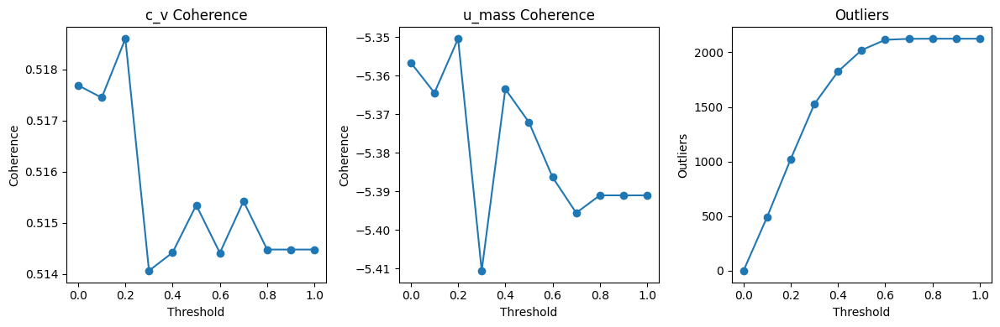

In [84]:
import matplotlib.pyplot as plt

# プロットデータの取得
thresholds = coh_result[:, 0]
c_v_coherence = coh_result[:, 1]
u_mass_coherence = coh_result[:, 2]
outliers = coh_result[:, 3]

# グラフを作成
plt.figure(figsize=(12, 4))
plt.subplot(131)
plt.plot(thresholds, c_v_coherence, marker='o')
plt.title('c_v Coherence')
plt.xlabel('Threshold')
plt.ylabel('Coherence')

plt.subplot(132)
plt.plot(thresholds, u_mass_coherence, marker='o')
plt.title('u_mass Coherence')
plt.xlabel('Threshold')
plt.ylabel('Coherence')

plt.subplot(133)
plt.plot(thresholds, outliers, marker='o')
plt.title('Outliers')
plt.xlabel('Threshold')
plt.ylabel('Outliers')

plt.tight_layout()

# グラフを画像として保存 (PNG フォーマット)
plt.savefig('coherence_plot.png')

# グラフを表示
plt.show()


In [55]:
topic_model_.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,1024,-1_fuzzy_linguistic_algorithm_algorithms,"[fuzzy, linguistic, algorithm, algorithms, int...",[this paper deals with the design of stable ru...
1,0,3915,0_fuzzy_topological_sets_topology,"[fuzzy, topological, sets, topology, compactne...",[in this paper we introduce and investigate we...
2,1,1254,1_fuzzy_adaptive_lyapunov_controller,"[fuzzy, adaptive, lyapunov, controller, nonlin...",[this paper is concerned with the problem of a...
3,2,263,2_multiobjective_fuzzy_optimization_constraint,"[multiobjective, fuzzy, optimization, constrai...",[two major approaches to deal with randomness ...
4,3,159,3_clustering_cluster_clusters_fuzzy,"[clustering, cluster, clusters, fuzzy, segment...",[clustering is one of the most popular data mi...
5,4,138,4_algebras_commutative_algebra_monadic,"[algebras, commutative, algebra, monadic, latt...",[state operators on convex effect algebras in ...
6,5,126,5_queries_querying_databases_database,"[queries, querying, databases, database, retri...",[uncertainty extensively exists in data and kn...
7,6,120,6_copulas_copula_aggregation_constructions,"[copulas, copula, aggregation, constructions, ...",[a new method of constructing lipschitz aggreg...
8,7,83,7_fuzzy_rough_sets_granular,"[fuzzy, rough, sets, granular, approximations,...",[in rough set theory the lower and upper appro...
9,8,79,8_fuzzy_recognition_images_pixels,"[fuzzy, recognition, images, pixels, filter, f...",[a multilayer feedforward fuzzy neural network...


In [38]:
# # Preprocess documents
# cleaned_docs = topic_model_._preprocess_text(abstracts)
#
# # Extract vectorizer and analyzer from BERTopic
# vectorizer = topic_model_.vectorizer_model
# analyzer = vectorizer.build_analyzer()
#
# # Extract features for Topic Coherence evaluation
# words = vectorizer.get_feature_names_out()
# tokens = [analyzer(doc) for doc in cleaned_docs]
# dictionary = corpora.Dictionary(tokens)
# corpus = [dictionary.doc2bow(token) for token in tokens]
# topic_words = [[words for words, _ in topic_model_.get_topic(topic)]
#                for topic in range(len(set(topics)) - 1)]
#
# # Evaluate c_v
# coherence_model = CoherenceModel(topics=topic_words,
#                                  texts=tokens,
#                                  corpus=corpus,
#                                  dictionary=dictionary,
#                                  coherence='c_v')
# coherence = coherence_model.get_coherence()
# print("strategy=\"probabilities\" threshold = 0.1 coherence-\"c_v\" is " + str(coherence))
#
# # Evaluate
# coherence_model = CoherenceModel(topics=topic_words,
#                                  texts=tokens,
#                                  corpus=corpus,
#                                  dictionary=dictionary,
#                                  coherence='u_mass')
# coherence = coherence_model.get_coherence()
# print("strategy=\"probabilities\" threshold = 0.1 coherence-\"u_mass\" is " + str(coherence))


strategy="probabilities" threshold = 0.1 coherence-"c_v" is 0.5176875021773463
strategy="probabilities" threshold = 0.1 coherence-"u_mass" is -5.356602410141168


In [ ]:
doc_img = topic_model_.visualize_documents(abstracts, hide_annotations=True, width=910,
                                           height=585)
doc_img.show()

In [ ]:
# sentence_model = SentenceTransformer("all-MiniLM-L6-v2")
# embeddings = sentence_model.encode(abstracts, show_progress_bar=True)
# # We reduce our embeddings to 2D as it will allows us to quickly iterate later on
# reduced_embeddings = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine',
#                           # random_state=42,
#                           ).fit_transform(embeddings)
# doc_plt = topic_model.visualize_documents(abstracts, reduced_embeddings=reduced_embeddings,
#                                           hide_document_hover=True, hide_annotations=True)
# doc_plt.show()

In [ ]:
distance_map = topic_model.visualize_topics()
distance_map.show()

In [ ]:
# DTM
nr_bins = 30
topics_over_time = topic_model.topics_over_time(abstracts, timestamps, nr_bins=nr_bins)

In [ ]:
# DTM可視化
import datetime

top_n_topics = 7

from_n = 0

img1 = topic_model.visualize_topics_over_time(topics_over_time, topics=[n + from_n for n in range(top_n_topics)],
                                              width=900, height=450)
img1.show()

now = datetime.datetime.now()

# file_png_name = "plt/plt_dtm_seed_" + str(random_state) + "_b_" + str(nr_bins) + "_t_" + str(
#     top_n_topics) + "_" + now.strftime(
#     '%Y-%m-%d%H-%M-%S') + ".png"
# file_html_name = "plt/plt_dtm_seed_" + str(random_state) + "_b_" + str(nr_bins) + "_t_" + str(
#     top_n_topics) + "_" + now.strftime(
#     '%Y-%m-%d%H-%M-%S') + ".html"
#
# path_dtm_png = pathlib.Path(file_png_name)
# path_dtm_html = pathlib.Path(file_html_name)
#
# img1.write_image(str(path_dtm_png))
# img1.write_html(str(path_dtm_html))